Code for **"Inpainting"** figures $6$, $8$ and 7 (top) from the main paper. 

# Import libs

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet2
from models import *
import torch
import torch.optim

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
PRINT = False
imsize = -1
dim_div_by = 64

# Choose figure

In [2]:
## Fig 6
img_path  = 'data/inpainting/vase.png'
mask_path = 'data/inpainting/vase_mask.png'

## Fig 8
# img_path  = 'data/inpainting/library.png'
# mask_path = 'data/inpainting/library_mask.png'

NET_TYPE = 'ResNet'

out_PSNR_name = 'data/testdata/inpainting/vase/loss_' + NET_TYPE + '.txt'
out_img_name = 'data/testdata/inpainting/vase/' + NET_TYPE + '.png'

# Load mask

In [3]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)

### Center crop

In [4]:
img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)

### Visualize

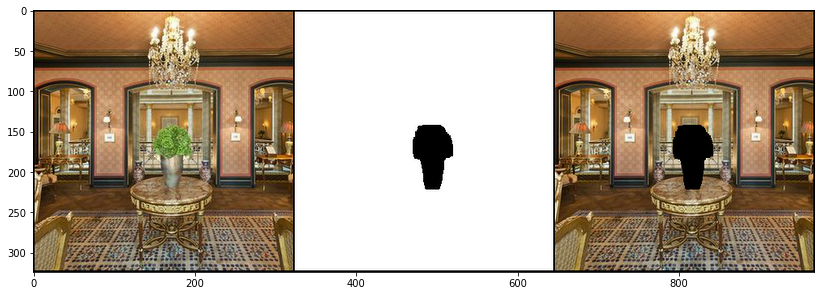

In [5]:
img_mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

# Setup

In [6]:
pad = 'reflection' # 'zero'
OPT_OVER = 'net'
OPTIMIZER = 'adam'

In [7]:
if 'vase.png' in img_path:
    INPUT = 'meshgrid'
    input_depth = 2
    LR = 0.01 
    num_iter = 3001
    param_noise = False
    show_every = 50
    figsize = 5
    reg_noise_std = 0.03
    
elif 'library.png' in img_path:
    
    INPUT = 'noise'
    input_depth = 1
    
    num_iter = 3001
    #num_iter = 10001

    show_every = 50
    figsize = 8
    reg_noise_std = 0.00
    param_noise = True
    
    LR = 0.01
    param_noise = False
    
else:
    assert False

print_every = 10
net = get_net(NET_TYPE, input_depth, 3)
net = net.type(dtype)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype)

In [8]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)

Number of params: 159267


# Main loop

In [9]:
progress_ckp = [0, 100, 200, 500, 1000, 2000, 3000]
ip_img_history = []

In [10]:
i = 0
def closure():
    
    global i, out_PSNR_name
    
    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        
        
    out = net(net_input)
    
   
    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()
        
    print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)
        
    # print to file
    if PRINT and i % print_every == 0:
        with open(out_PSNR_name,'a') as f:
            f.write('%5d %f\n'%(i, total_loss.item()))
            
    if i in progress_ckp:
        ip_img_history.append(np.clip(out_np, 0, 1))
        
    i += 1

    return total_loss

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

Starting optimization with ADAM


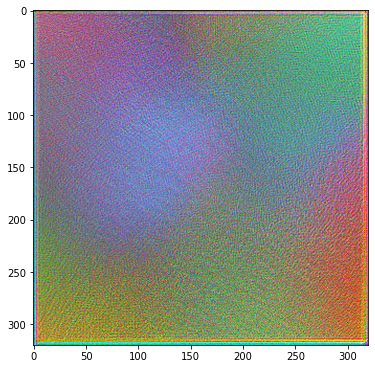

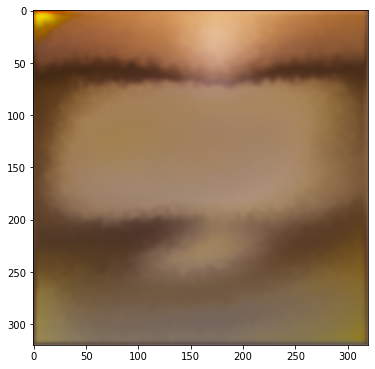

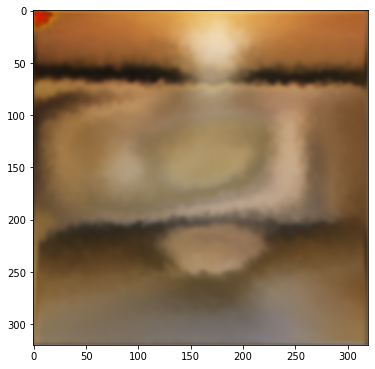

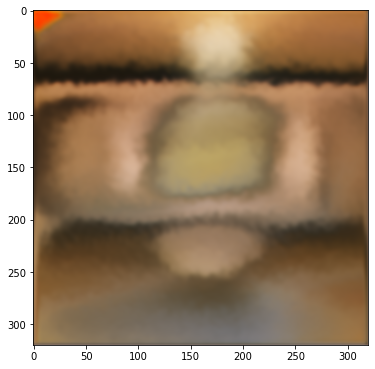

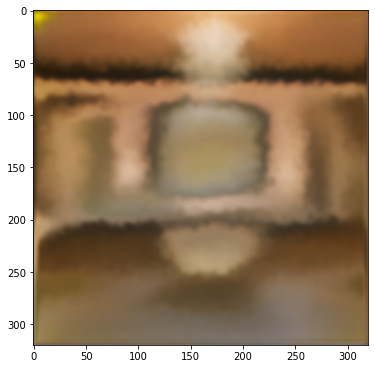

...

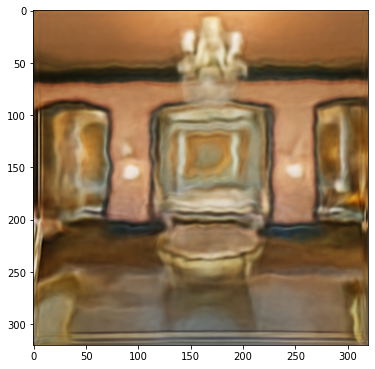

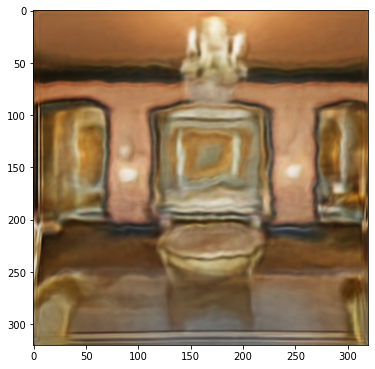

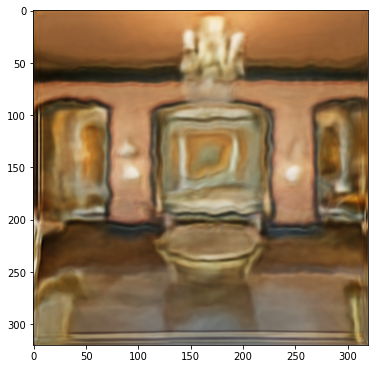

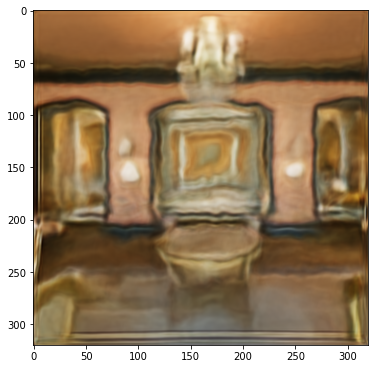

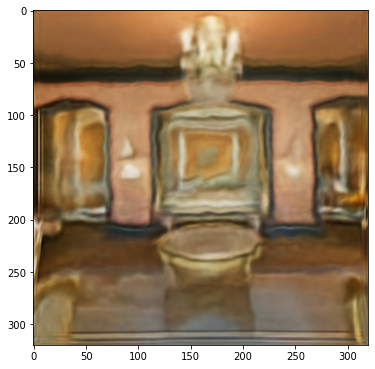

In [11]:
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

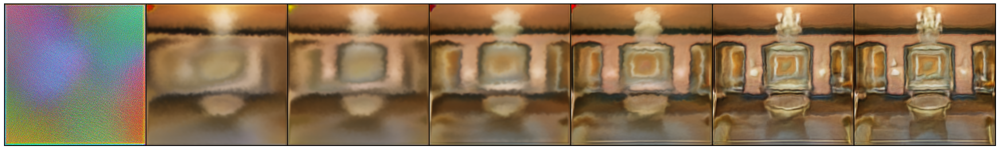

In [12]:
save_image_grid(out_img_name, ip_img_history, 7, 24)